In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# IMAGE PROCESSOR

The following code process scanner images to adjust the brightness, contrast, and applies a smoothing consistently throughout a folder of images.

The results are displayed side by side for comparison.

**## Setting  image folder path**


In [ ]:
# Set the paths to your folders of engine cylinder bore images
folder_path = "/content/drive/MyDrive/biomed/ImagesTablingEvent/all"

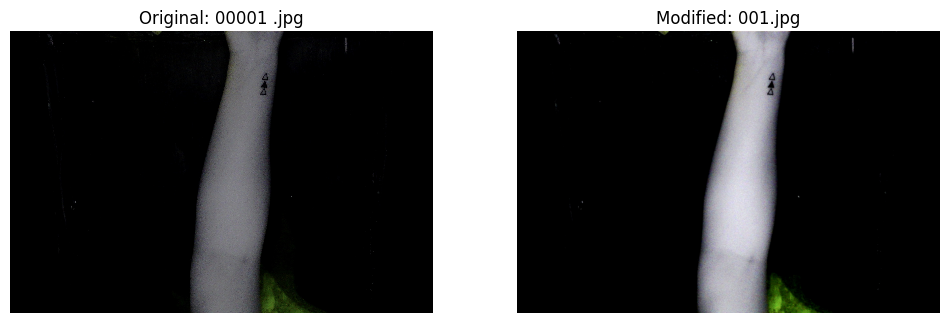

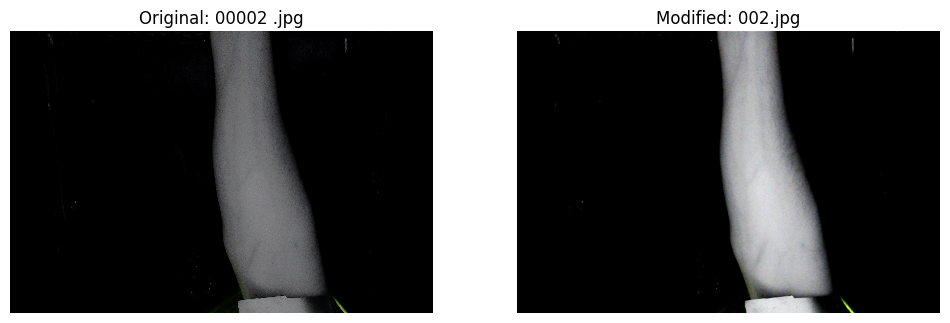

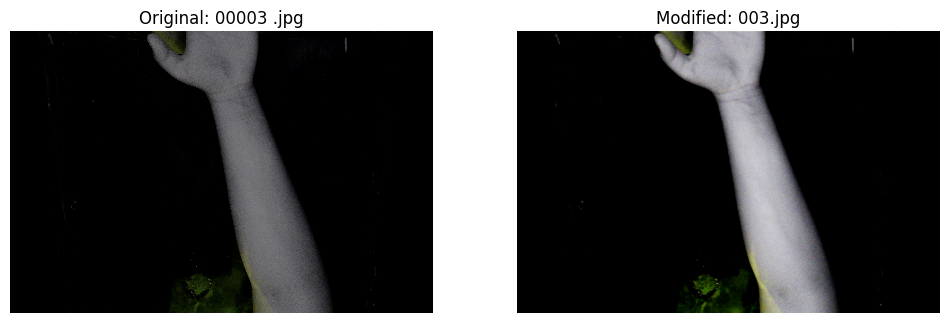

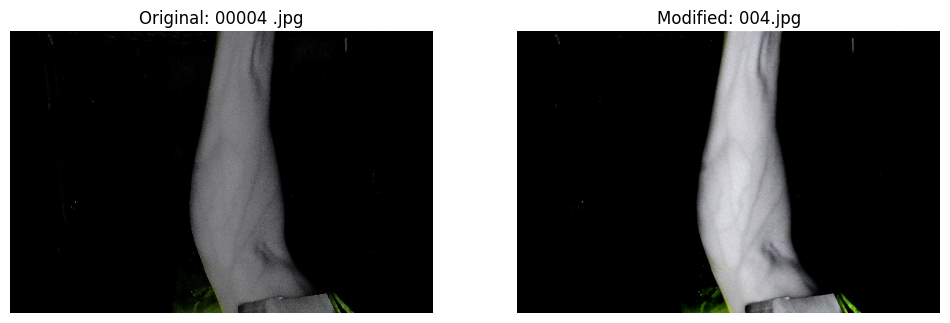

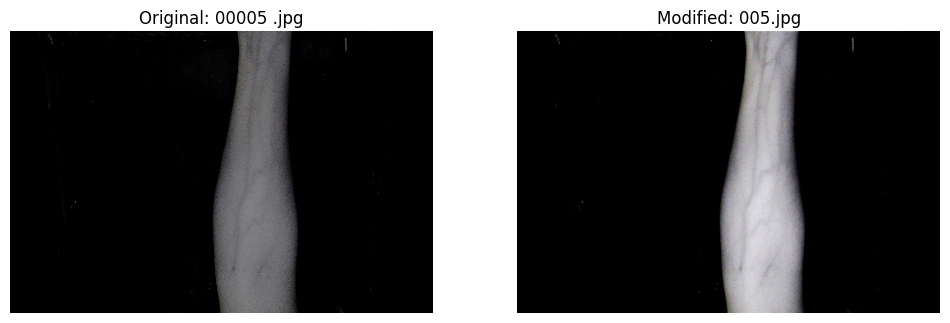

...

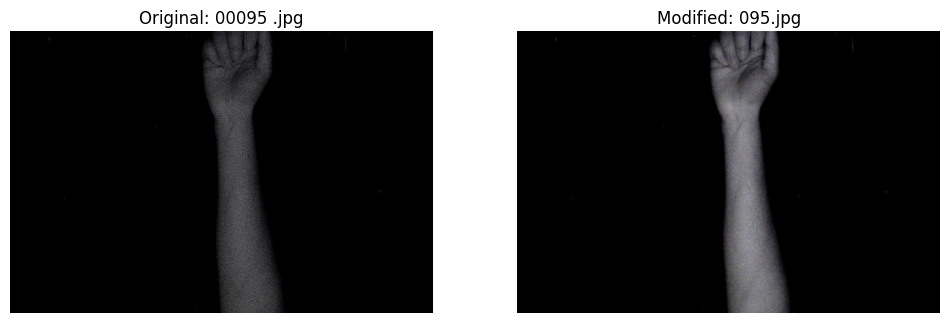

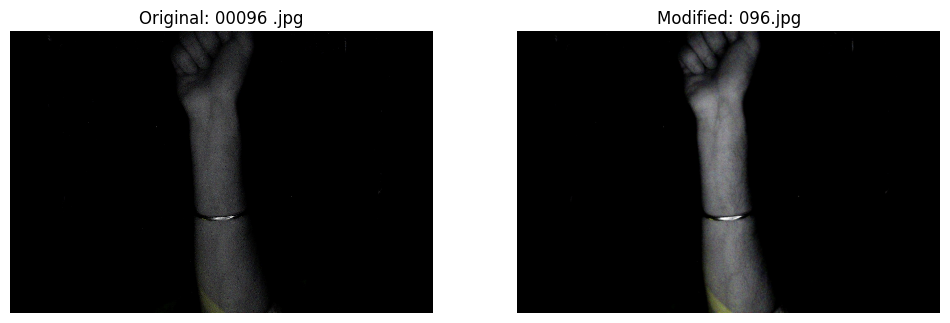

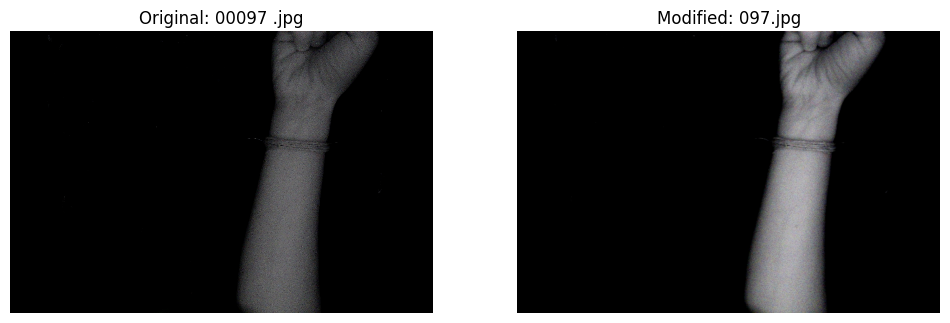

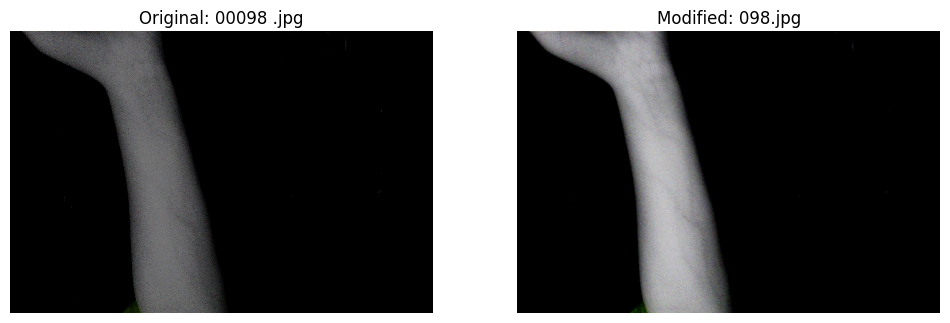

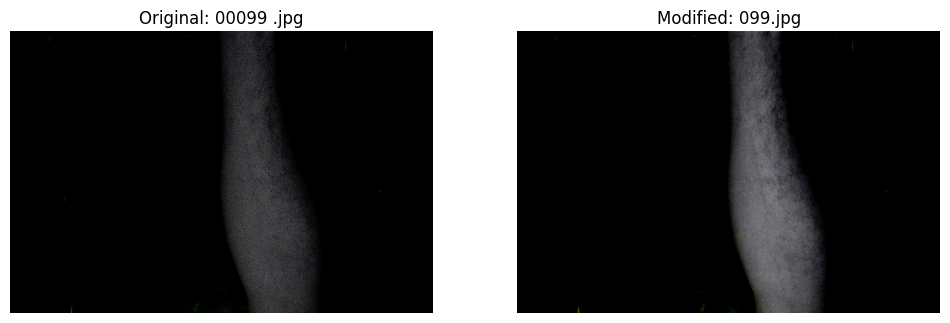

In [ ]:
from PIL import Image, ImageEnhance, ImageFilter
import os
import matplotlib.pyplot as plt

# Set the brightness and contrast levels to adjust the images
brightness = .75
contrast = 2.5

# Set the radius value for the Gaussian smoothing filter
radius = 2.5

# Define the file extensions to look for
valid_extensions = (".jpg", ".jpeg", ".png", ".bmp", ".gif", ".tiff")

# Define the output folder path
output_folder = "/content/drive/MyDrive/biomed/ImagesTablingEvent/preprocessed_all1"

# Create the output folder if it does not already exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Loop through all the files in the folder
for i, filename in enumerate(sorted(os.listdir(folder_path))):
    if filename.lower().endswith(valid_extensions):
        # Open the original image
        original_img = Image.open(os.path.join(folder_path, filename))
        
        # Adjust the brightness and contrast of the original image
        modified_img = ImageEnhance.Brightness(original_img).enhance(brightness)
        modified_img = ImageEnhance.Contrast(modified_img).enhance(contrast)

        # Apply Gaussian smoothing to the modified image
        modified_img = modified_img.filter(ImageFilter.GaussianBlur(radius=radius))
        
        # Generate the output filename in the desired format
        output_filename = "{:03d}.{}".format(i+1, filename.split(".")[-1])
        output_filepath = os.path.join(output_folder, output_filename)

        # Save the modified image to the output file
        modified_img.save(output_filepath)
        
        # Display the original and modified images
        fig, axs = plt.subplots(1, 2, figsize=(12, 6))
        axs[0].imshow(original_img, aspect='equal', cmap='gray', interpolation='nearest', vmin=0, vmax=255)
        axs[0].axis("off")
        axs[0].set_title("Original: " + filename)

        axs[1].imshow(modified_img, aspect='equal', cmap='gray', interpolation='nearest', vmin=0, vmax=255)
        axs[1].axis("off")
        axs[1].set_title("Modified: " + output_filename)
        
        plt.show()